In [1]:
import scanpy as sc
import scarches
from scarches.models.scpoli import scPoli
import scib
import os
import anndata
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score
import matplotlib.colors as colors

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
 captum (see https://github.com/pytorch/captum).


# Prepare adata

In [156]:
adata = sc.read_h5ad("Altas_level1-noprototypes-allgenes-names-mse3-reload-corrected2.h5ad") # revision 1 new pipeline, only level 1 corrected and with new pDC cluster as Dendritic cells

In [157]:
adata_post_pp = sc.read_h5ad("big-datasets-concat-ensembl-nodub-newfern_with6-aggr-all-sparse-scranlog1p-annot-nodoublets-pp.h5ad")

In [158]:
# map celltypes level1 and level2 from adata (all genes, gene names) to the pp (HVG, PCA, checks, Ensembl ids)
# override old cell_type_level1, which has unknown because pre level1 integrations/mapping
adata_post_pp.obs["cell_type_level1"] = adata.obs["cell_type_level1_all"]
#adata_post_pp.obs["cell_type_level2"] = adata.obs["cell_type_level2"]
adata_post_pp.obs["cell_type_level1_corrected"] = adata.obs["cell_type_level1_corrected"] # for new pipeline with no level 2
del adata_post_pp.obs["atlas_key"]

In [159]:
# add new atlas_key
adata_post_pp.obs["atlas_key"] = ["query" if cell_type == "unknown" else "ref" for cell_type in adata_post_pp.obs["cell_type_level1_corrected"]] # for new pipeline with no level 2

In [160]:
adata_post_pp.write_h5ad("mse3-reload-hvg-level1_corrected2-preint.h5ad") # for new pipeline with no level 2 with new pdc

In [161]:
adata = sc.read_h5ad("mse3-reload-hvg-level1_corrected2-preint.h5ad") # for new pipeline with no level 2 with new pdc

In [162]:
# Subset where atlas_key is 'ref'
adata_ref = adata[adata.obs['atlas_key'] == 'ref'].copy()

# Subset where atlas_key is 'query'
adata_query = adata[adata.obs['atlas_key'] == 'query'].copy()

In [163]:
#adata_ref.obs["cell_type_level2"].value_counts()
adata_ref.obs["cell_type_level1_corrected"].value_counts()

cell_type_level1_corrected
T cell                99886
Macrophage            16870
Smooth Muscle Cell     9405
B cell                 8610
Monocyte               8094
NK cell                7177
EC                     6610
Fibroblast             4976
Neutrophil             2985
Dendritic cell         2679
Fibromyocyte           2419
Mast cell              1531
Plasma cell            1530
Name: count, dtype: int64

In [164]:
#adata_query.obs["cell_type_level2"].value_counts()
adata_query.obs["cell_type_level1_corrected"].value_counts()

cell_type_level1_corrected
unknown    11863
Name: count, dtype: int64

# Train reference

In [165]:
early_stopping_kwargs = {
    "early_stopping_metric": "val_prototype_loss",
    "mode": "min",
    "threshold": 0,
    "patience": 20,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}
    
scpoli_model = scPoli(
adata=adata_ref,
condition_keys="sample",
#cell_type_keys="cell_type_level2",
cell_type_keys="cell_type_level1_corrected", # for new pipeline
embedding_dims=10,
recon_loss='mse',
)

scpoli_model.train(
    n_epochs=50,
    pretraining_epochs=40,
    early_stopping_kwargs=early_stopping_kwargs,
    eta=5,
)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scarches/models/scpoli/scpoli_model.py:151: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  self.obs_metadata_ = adata.obs.groupby('conditions_combined').first()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scarches/models/scpoli/scpoli_model.py:156: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  self.obs_metadata_ = adata.obs.groupby(condition_keys).first()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scarches/models/sc

Embedding dictionary:
 	Num conditions: [61]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 2000 45 10
	Mean/Var Layer in/out: 45 10
Decoder Architecture:
	First Layer in, out and cond:  10 45 10
	Output Layer in/out:  45 2000 

Initializing dataloaders
Starting training
 |████████████████████| 100.0%  - val_loss:  174.38 - val_cvae_loss:  163.80 - val_prototype_loss:   10.58 - val_labeled_loss:    2.12


In [166]:
scpoli_model.save("models/refmse3-level1_corrected2", overwrite=True) # new pipeline with pdcs

# Train with query

In [167]:
scpoli_query = scPoli.load_query_data(
    adata=adata_query,
    reference_model=scpoli_model,
    labeled_indices=[],
)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scarches/models/scpoli/scpoli_model.py:777: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  new_obs_metadata = adata.obs.groupby('conditions_combined').first()


Embedding dictionary:
 	Num conditions: [61]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 2000 45 10
	Mean/Var Layer in/out: 45 10
Decoder Architecture:
	First Layer in, out and cond:  10 45 10
	Output Layer in/out:  45 2000 



/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scarches/models/scpoli/scpoli_model.py:156: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  self.obs_metadata_ = adata.obs.groupby(condition_keys).first()


In [168]:
scpoli_query.train(
    n_epochs=50,
    pretraining_epochs=40,
    eta=10
)

The missing labels are: {'unknown'}
Therefore integer value of those labels is set to -1
The missing labels are: {'unknown'}
Therefore integer value of those labels is set to -1
The missing labels are: {'unknown'}
Therefore integer value of those labels is set to -1
The missing labels are: {'unknown'}
Therefore integer value of those labels is set to -1
Initializing dataloaders
Starting training
 |████████████████----| 80.0%  - val_loss:  240.22 - val_cvae_loss:  240.22
Initializing unlabeled prototypes with Leiden with an unknown number of  clusters.
Clustering succesful. Found 31 clusters.
 |████████████████████| 100.0%  - val_loss:  247.56 - val_cvae_loss:  247.56 - val_prototype_loss:    0.00 - val_unlabeled_loss:    0.25


In [169]:
scpoli_query.save("models/querymse3-level1_corrected2", overwrite=True) # with new pdcs

# Reload

In [170]:
early_stopping_kwargs = {
    "early_stopping_metric": "val_prototype_loss",
    "mode": "min",
    "threshold": 0,
    "patience": 20,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}
    
scpoli_model = scPoli(
adata=adata_ref,
condition_keys="sample",
cell_type_keys="cell_type_level1_corrected",
embedding_dims=10,
recon_loss='mse',
)

Embedding dictionary:
 	Num conditions: [61]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 2000 45 10
	Mean/Var Layer in/out: 45 10
Decoder Architecture:
	First Layer in, out and cond:  10 45 10
	Output Layer in/out:  45 2000 



/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scarches/models/scpoli/scpoli_model.py:151: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  self.obs_metadata_ = adata.obs.groupby('conditions_combined').first()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scarches/models/scpoli/scpoli_model.py:156: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  self.obs_metadata_ = adata.obs.groupby(condition_keys).first()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scarches/models/sc

In [171]:
scpoli_query = scPoli.load_query_data(
    adata=adata_query,
    reference_model=scpoli_model,
    labeled_indices=[],
)

Embedding dictionary:
 	Num conditions: [61]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 2000 45 10
	Mean/Var Layer in/out: 45 10
Decoder Architecture:
	First Layer in, out and cond:  10 45 10
	Output Layer in/out:  45 2000 



/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scarches/models/scpoli/scpoli_model.py:777: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  new_obs_metadata = adata.obs.groupby('conditions_combined').first()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scarches/models/scpoli/scpoli_model.py:156: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  self.obs_metadata_ = adata.obs.groupby(condition_keys).first()


In [172]:
adata_query.X = adata_query.X.astype("float32")

In [173]:
adata_ref.X = adata_ref.X.astype("float32")

In [174]:
scpoli_loaded = scpoli_query.load(dir_path="models/querymse3-level1_corrected2", adata=adata_query)

AnnData object with n_obs × n_vars = 11863 × 2000
    obs: 'dataset', 'cell_type', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'sample', 'scDblFinder.sample', 'scDblFinder.class', 'scDblFinder.score', 'scDblFinder.weighted', 'scDblFinder.cxds_score', 'decontX_contamination', 'decontX_clusters', 'symptoms', 'n_genes', 'n_counts', 'size_factors', 'cell_type_level1', 'cell_type_level1_corrected', 'atlas_key', 'conditions_combined'
    var: 'original_gene_names', 'highly_variable'
    uns: 'log1p', 'neighbors', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts', 'raw_decontXcounts', 'uncorrected_counts'
    obsp: 'connectivities', 'distances'
Embedding dictionary:
 	Num conditions: [61]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 2000 45 10
	Mean/Var Layer in/out: 45 10
Decoder Architecture:
	First Layer in, out and cond:  10 45 10
	Output Layer in/out:  45 2000 



/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scarches/models/scpoli/scpoli_model.py:156: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  self.obs_metadata_ = adata.obs.groupby(condition_keys).first()


In [175]:
results_dict = scpoli_loaded.classify(adata_query, scale_uncertainties=True)

In [176]:
#get latent representation of reference data
scpoli_loaded.model.eval()
data_latent_source = scpoli_loaded.get_latent(
    adata_ref,
    mean=True
)

adata_latent_source = sc.AnnData(data_latent_source)
adata_latent_source.obs = adata_ref.obs.copy()

#get latent representation of query data
data_latent= scpoli_loaded.get_latent(
    adata_query,
    mean=True
)

adata_latent = sc.AnnData(data_latent)
adata_latent.obs = adata_query.obs.copy()

#get label annotations
adata_latent.obs['cell_type_pred'] = results_dict['cell_type_level1_corrected']['preds'].tolist()
adata_latent.obs['cell_type_uncert'] = results_dict['cell_type_level1_corrected']['uncert'].tolist()

#join adatas
adata_latent_full = adata_latent_source.concatenate(
    [adata_latent],
    batch_key='query'
)


adata_latent_full.obs['cell_type_pred'][adata_latent_full.obs['query'].isin(['0'])] = "Reference" #np.nan

/tmp/ipykernel_1424236/794593172.py:42: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_latent_full = adata_latent_source.concatenate(
/tmp/ipykernel_1424236/794593172.py:48: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps upda

In [177]:
sc.pp.neighbors(adata_latent_full, n_neighbors=15)
sc.tl.umap(adata_latent_full)

In [180]:
adata_latent_full.obs['cell_type_level1_all'] = [
    row['cell_type_level1_corrected'] if row['cell_type_pred'] == 'Reference' else row['cell_type_pred'] 
    for _, row in adata_latent_full.obs.iterrows()
]

In [ ]:
# remove uncertain cells

In [190]:
adata_latent_full

AnnData object with n_obs × n_vars = 184635 × 10
    obs: 'dataset', 'cell_type', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'sample', 'scDblFinder.sample', 'scDblFinder.class', 'scDblFinder.score', 'scDblFinder.weighted', 'scDblFinder.cxds_score', 'decontX_contamination', 'decontX_clusters', 'symptoms', 'n_genes', 'n_counts', 'size_factors', 'cell_type_level1', 'cell_type_level1_corrected', 'atlas_key', 'conditions_combined', 'cell_type_pred', 'cell_type_uncert', 'query', 'cell_type_level1_all'
    uns: 'neighbors', 'umap', 'cell_type_pred_colors', 'cell_type_level1_all_colors'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

In [192]:
adata_latent_full_filtered = adata_latent_full[(adata_latent_full.obs['cell_type_uncert'] <= 0.5) | (adata_latent_full.obs['cell_type_uncert'].isna())].copy()

In [193]:
adata_latent_full_filtered

AnnData object with n_obs × n_vars = 184094 × 10
    obs: 'dataset', 'cell_type', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'sample', 'scDblFinder.sample', 'scDblFinder.class', 'scDblFinder.score', 'scDblFinder.weighted', 'scDblFinder.cxds_score', 'decontX_contamination', 'decontX_clusters', 'symptoms', 'n_genes', 'n_counts', 'size_factors', 'cell_type_level1', 'cell_type_level1_corrected', 'atlas_key', 'conditions_combined', 'cell_type_pred', 'cell_type_uncert', 'query', 'cell_type_level1_all'
    uns: 'neighbors', 'umap', 'cell_type_pred_colors', 'cell_type_level1_all_colors'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

In [208]:
adata_latent_full_filtered.write_h5ad("Altas_level1-noprototypes-mse-3-reload-corrected2-nouncert.h5ad")

## Plots for figure in paper

In [4]:
adata_latent_full = sc.read_h5ad("Altas_level1-noprototypes-mse-3-reload-corrected2-nouncert.h5ad")

In [7]:
adata_latent_full.obs

,dataset,cell_type,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,sample,scDblFinder.sample,scDblFinder.class,scDblFinder.score,...,n_counts,size_factors,cell_type_level1,cell_type_level1_corrected,atlas_key,conditions_combined,cell_type_pred,cell_type_uncert,query,cell_type_level1_all
car02_d_AAATGGATCGAGTGGA.1-0,Roche,CD8 T,647.0,1273.0,78.0,6.127258,2_Roche,2,singlet,0.507475,...,NaN,0.306150,NK,T cell,ref,2_Roche,Reference,NaN,0,T cell
car02_d_AAGGAATGTCGTTGGC.1-0,Roche,Inf MΦ,2881.0,9727.0,1564.0,16.078955,2_Roche,2,singlet,0.563011,...,NaN,2.219434,Macrophage,Macrophage,ref,2_Roche,Reference,NaN,0,Macrophage
car02_d_AATGGCTTCTTCCAGC.1-0,Roche,TREM2 MΦ,4906.0,43494.0,3031.0,6.968777,2_Roche,2,doublet,0.675130,...,NaN,9.472461,Macrophage,Macrophage,ref,2_Roche,Reference,NaN,0,Macrophage
car02_d_ACCTACCGTTTACTGG.1-0,Roche,Plasma cell,335.0,8015.0,3.0,0.037430,2_Roche,2,singlet,0.501177,...,NaN,0.099273,Plasma cell,Plasma cell,ref,2_Roche,Reference,NaN,0,Plasma cell
car02_d_ACCTGAAGTCATCCCT.1-0,Roche,Mast cell,1113.0,2843.0,219.0,7.703130,2_Roche,2,singlet,0.520772,...,NaN,0.092680,Mast cell,Mast cell,ref,2_Roche,Reference,NaN,0,Mast cell
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Fresh_DTAN_4047_TTGAACGCAATGGACG-1-1,Jaiswal,Foam cells,564.0,1832.0,26.0,1.419214,2_Jaiswal,2,singlet,0.001764,...,1832.0,0.267544,Macrophage,unknown,query,2_Jaiswal,Macrophage,0.465370,1,Macrophage
Fresh_DTAN_4047_TTGAACGCATCTCGCT-1-1,Jaiswal,Foam cells,211.0,1081.0,2.0,0.185014,2_Jaiswal,2,singlet,0.004880,...,1081.0,0.071870,Macrophage,unknown,query,2_Jaiswal,Macrophage,0.146040,1,Macrophage
Fresh_DTAN_4047_TTGGAACCACCGTTGG-1-1,Jaiswal,Foam cells,734.0,1989.0,132.0,6.636501,2_Jaiswal,2,singlet,0.002188,...,1989.0,0.368537,Macrophage,unknown,query,2_Jaiswal,Macrophage,0.177523,1,Macrophage
Fresh_DTAN_4047_TTGTAGGGTAGGCTGA-1-1,Jaiswal,Foam cells,1121.0,3510.0,2.0,0.056980,2_Jaiswal,2,singlet,0.005225,...,3510.0,0.724582,Macrophage,unknown,query,2_Jaiswal,Macrophage,0.286143,1,Macrophage


In [6]:
adata_latent_full.obs["cell_type_level1_all"].value_counts()

cell_type_level1_all
T cell                102066
Macrophage             19225
NK cell                10613
Smooth Muscle Cell      9525
Monocyte                9084
B cell                  8691
EC                      6611
Fibroblast              5242
Dendritic cell          4139
Neutrophil              3016
Fibromyocyte            2617
Mast cell               1707
Plasma cell             1558
Name: count, dtype: int64

In [8]:
adata_latent_full.obs['cell_type_level1'] = adata_latent_full.obs["cell_type_level1_all"]

In [9]:
adata_latent_full.obs

,dataset,cell_type,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,sample,scDblFinder.sample,scDblFinder.class,scDblFinder.score,...,n_counts,size_factors,cell_type_level1,cell_type_level1_corrected,atlas_key,conditions_combined,cell_type_pred,cell_type_uncert,query,cell_type_level1_all
car02_d_AAATGGATCGAGTGGA.1-0,Roche,CD8 T,647.0,1273.0,78.0,6.127258,2_Roche,2,singlet,0.507475,...,NaN,0.306150,T cell,T cell,ref,2_Roche,Reference,NaN,0,T cell
car02_d_AAGGAATGTCGTTGGC.1-0,Roche,Inf MΦ,2881.0,9727.0,1564.0,16.078955,2_Roche,2,singlet,0.563011,...,NaN,2.219434,Macrophage,Macrophage,ref,2_Roche,Reference,NaN,0,Macrophage
car02_d_AATGGCTTCTTCCAGC.1-0,Roche,TREM2 MΦ,4906.0,43494.0,3031.0,6.968777,2_Roche,2,doublet,0.675130,...,NaN,9.472461,Macrophage,Macrophage,ref,2_Roche,Reference,NaN,0,Macrophage
car02_d_ACCTACCGTTTACTGG.1-0,Roche,Plasma cell,335.0,8015.0,3.0,0.037430,2_Roche,2,singlet,0.501177,...,NaN,0.099273,Plasma cell,Plasma cell,ref,2_Roche,Reference,NaN,0,Plasma cell
car02_d_ACCTGAAGTCATCCCT.1-0,Roche,Mast cell,1113.0,2843.0,219.0,7.703130,2_Roche,2,singlet,0.520772,...,NaN,0.092680,Mast cell,Mast cell,ref,2_Roche,Reference,NaN,0,Mast cell
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Fresh_DTAN_4047_TTGAACGCAATGGACG-1-1,Jaiswal,Foam cells,564.0,1832.0,26.0,1.419214,2_Jaiswal,2,singlet,0.001764,...,1832.0,0.267544,Macrophage,unknown,query,2_Jaiswal,Macrophage,0.465370,1,Macrophage
Fresh_DTAN_4047_TTGAACGCATCTCGCT-1-1,Jaiswal,Foam cells,211.0,1081.0,2.0,0.185014,2_Jaiswal,2,singlet,0.004880,...,1081.0,0.071870,Macrophage,unknown,query,2_Jaiswal,Macrophage,0.146040,1,Macrophage
Fresh_DTAN_4047_TTGGAACCACCGTTGG-1-1,Jaiswal,Foam cells,734.0,1989.0,132.0,6.636501,2_Jaiswal,2,singlet,0.002188,...,1989.0,0.368537,Macrophage,unknown,query,2_Jaiswal,Macrophage,0.177523,1,Macrophage
Fresh_DTAN_4047_TTGTAGGGTAGGCTGA-1-1,Jaiswal,Foam cells,1121.0,3510.0,2.0,0.056980,2_Jaiswal,2,singlet,0.005225,...,3510.0,0.724582,Macrophage,unknown,query,2_Jaiswal,Macrophage,0.286143,1,Macrophage


In [18]:
# for corrected2
color_palette_level1 = {
    'T cell': '#3182bd',                       # blue for all T cell types
    'Macrophage': '#8c564b',                   # brown for all macrophages
    'Plasma cell': '#ff7f0e',                  # vibrant orange
    'Mast cell': '#d62728',                    # red
    'NK cell': '#98df8a',                      # light green
    'Fibromyocyte': '#f7b6d2',                 # pastel pink
    'Smooth Muscle Cell': '#7b4173',           # deeper purple
    'Fibroblast': '#e377c2',                   # bright pink
    'B cell': '#2ca02c',                       # green
    'Dendritic cell': '#807dba',               # violet for dendritic cells
    'EC': '#fdae6b',                           # orange for all endothelial cells  
    'Monocyte': '#c7c7c7',                     # lighter gray
    'Neutrophil': '#17becf'                    # teal
}

In [11]:
dataset_renaming_dict = {
    "Roche": "Pauli",
    "Emoto_ACS": "Emoto",
    "Emoto_SAP": "Emoto"
}

In [12]:
adata_latent_full.obs['dataset'] = adata_latent_full.obs['dataset'].map(lambda x: dataset_renaming_dict.get(x, x))

In [13]:
origin_mapping_dict = {
    'Pauli':"carotid",
    'Alsaigh':"carotid",
    'Fernandez':"carotid",
    'Wirka':"coronary",
    'Emoto':"coronary",
    'Chowdhury':"coronary",
    'Pan': "carotid",
    'Dib':"carotid",
    'Slysz':"carotid",
    'Slysz_femoral':"femoral",
    'Jaiswal':"carotid"
}

In [14]:
adata_latent_full.obs['origin'] = adata_latent_full.obs['dataset'].map(origin_mapping_dict).fillna("no map")

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


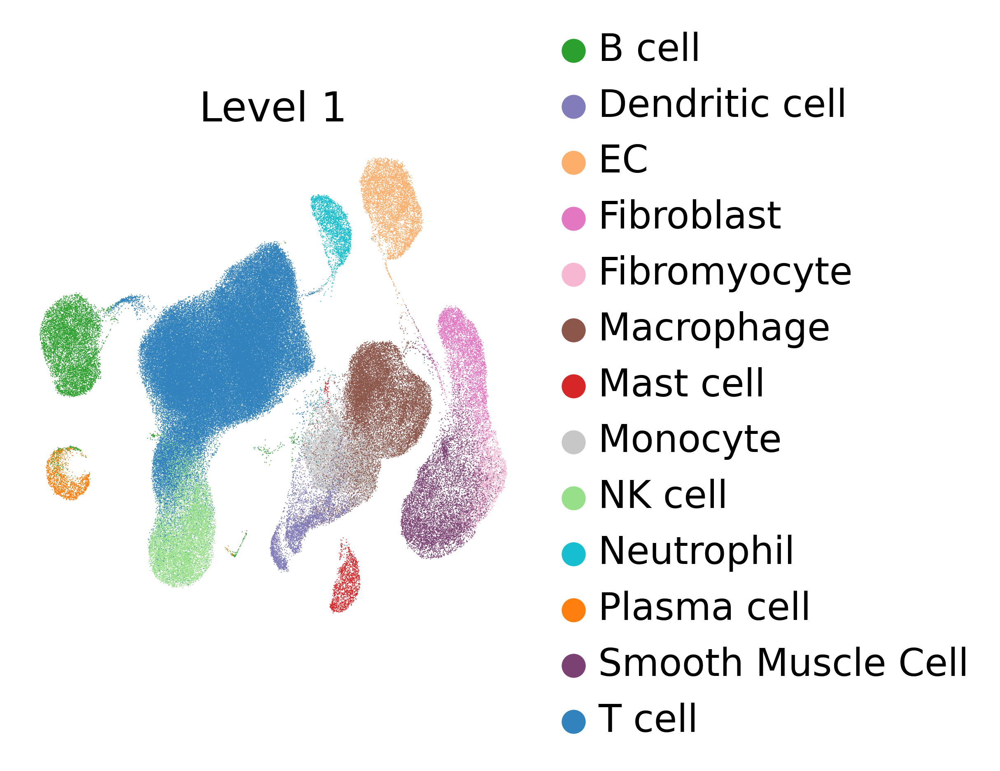

In [20]:
sc.pl.umap(
    adata_latent_full,
    color='cell_type_level1',
    show=True,
    frameon=False,
    palette = color_palette_level1,
    vmax=1,
    title="Level 1",
    save="_mse3-reload_level1-corrected2.pdf"
)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


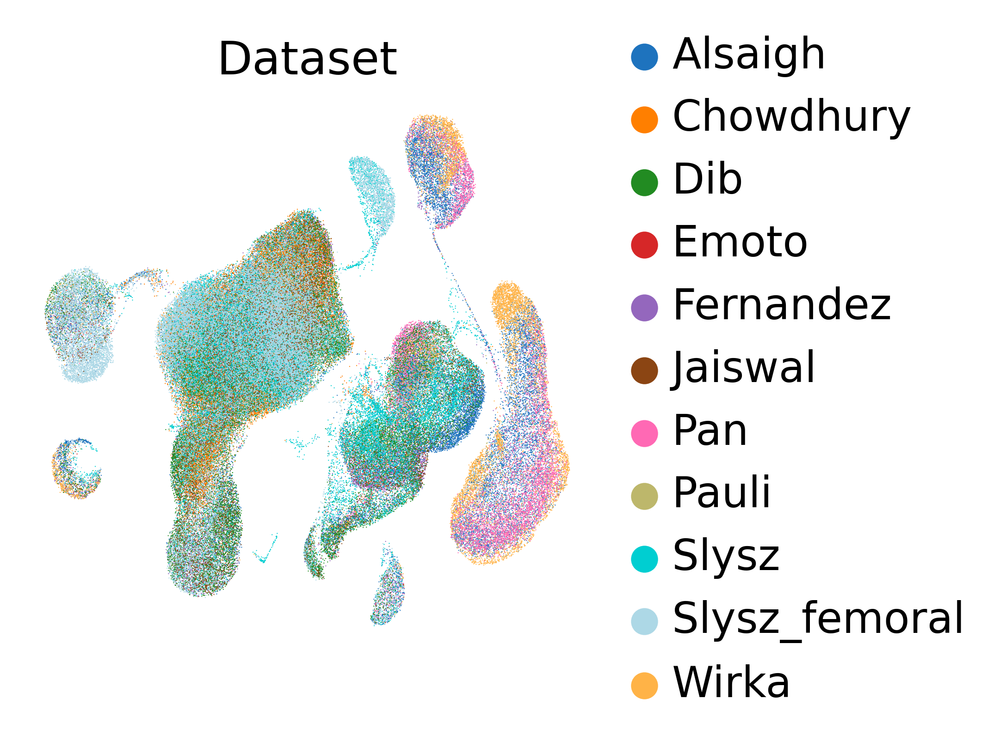

In [27]:
sc.pl.umap(
    adata_latent_full,
    color='dataset',
    show=True,
    frameon=False,
    palette=origin_colors,
    vmax=1,
    title="Dataset",
    save="_mse3-reload_dataset-corrected2.pdf"
)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


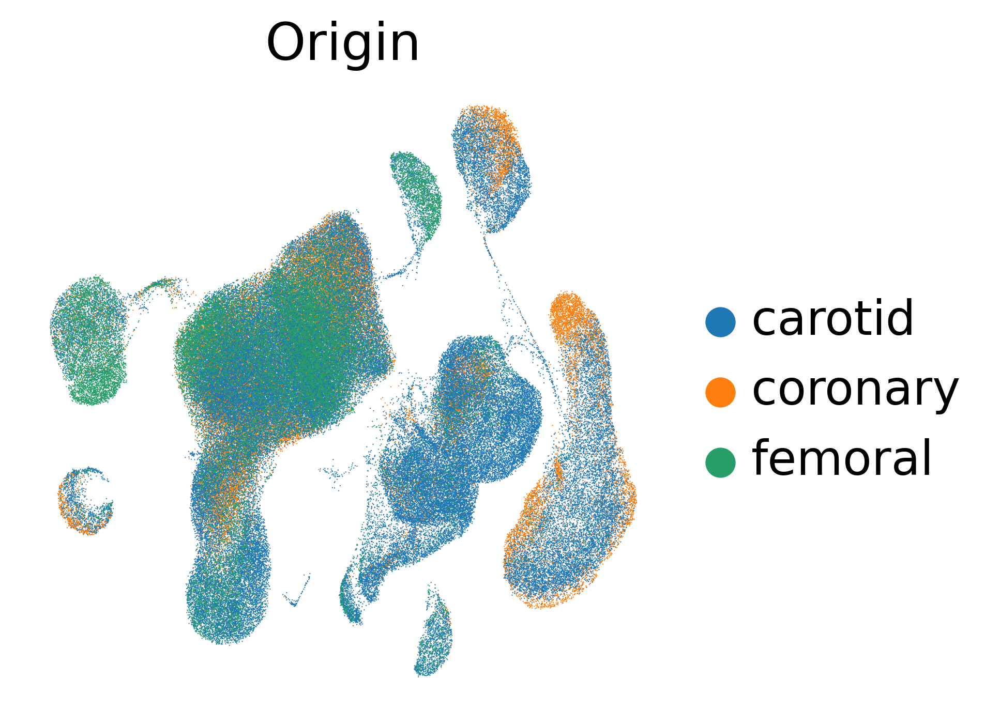

In [22]:
sc.pl.umap(
    adata_latent_full,
    color='origin',
    show=True,
    frameon=False,
    #cmap='magma',
    vmax=1,
    title="Origin",
    save="_mse3-reload_origin-corrected2.pdf"
)

# Valdiate annotations

In [2]:
adata_latent_full = sc.read_h5ad("Altas_level1-noprototypes-allgenes-names-mse3-reload-corrected2-nouncert.h5ad") # new pipeline with pdcs and no uncertains

In [262]:
adata_latent_full.obs

,dataset,cell_type,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,sample,scDblFinder.sample,scDblFinder.class,scDblFinder.score,scDblFinder.weighted,scDblFinder.cxds_score,decontX_contamination,decontX_clusters,symptoms,n_genes,n_counts,size_factors,cell_type_level1
car02_d_AAATGGATCGAGTGGA.1,Roche,CD8 T,647.0,1273.0,78.0,6.127258,2_Roche,2,singlet,0.507475,1.000000,0.014949,0.000529,2-1,NaN,NaN,NaN,0.306150,T cell
car02_d_AAGGAATGTCGTTGGC.1,Roche,Inf MΦ,2881.0,9727.0,1564.0,16.078955,2_Roche,2,singlet,0.563011,1.000000,0.126022,0.024352,2-2,NaN,NaN,NaN,2.219434,Macrophage
car02_d_AATGGCTTCTTCCAGC.1,Roche,TREM2 MΦ,4906.0,43494.0,3031.0,6.968777,2_Roche,2,doublet,0.675130,0.973690,0.390259,0.000323,2-2,NaN,NaN,NaN,9.472461,Macrophage
car02_d_ACCTACCGTTTACTGG.1,Roche,Plasma cell,335.0,8015.0,3.0,0.037430,2_Roche,2,singlet,0.501177,1.000000,0.002354,0.000003,2-2,NaN,NaN,NaN,0.099273,Plasma cell
car02_d_ACCTGAAGTCATCCCT.1,Roche,Mast cell,1113.0,2843.0,219.0,7.703130,2_Roche,2,singlet,0.520772,1.000000,0.041544,0.753178,2-2,NaN,NaN,NaN,0.092680,Mast cell
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Fresh_DTAN_4047_TTTGTCAAGGACTGGT-1,Jaiswal,CD8+ T-cells,1254.0,3224.0,108.0,3.349876,2_Jaiswal,2,singlet,0.043425,0.733000,0.009147,0.026254,2-4,not stated,1254.0,3224.0,0.763210,T cell
Fresh_DTAN_4047_TTTGTCAGTAGGCTGA-1,Jaiswal,CD4+ T-cells,1189.0,4195.0,126.0,3.003576,2_Jaiswal,2,singlet,0.108291,0.677275,0.024988,0.003678,2-5,not stated,1189.0,4194.0,0.774646,T cell
Fresh_DTAN_4047_TTTGTCATCAACACAC-1,Jaiswal,CD8+ T-cells,1236.0,3195.0,54.0,1.690141,2_Jaiswal,2,singlet,0.106050,0.705021,0.037757,0.054584,2-7,not stated,1236.0,3194.0,0.782079,NK cell
Fresh_DTAN_4047_TTTGTCATCATAACCG-1,Jaiswal,B-cells,984.0,2843.0,91.0,3.200844,2_Jaiswal,2,singlet,0.002852,0.311139,0.000223,0.015132,2-9,not stated,984.0,2840.0,0.553815,B cell


In [263]:
adata_latent_full.obs["cell_type_level1"].value_counts()

cell_type_level1
T cell                102066
Macrophage             19225
NK cell                10613
Smooth Muscle Cell      9525
Monocyte                9084
B cell                  8691
EC                      6611
Fibroblast              5242
Dendritic cell          4139
Neutrophil              3016
Fibromyocyte            2617
Mast cell               1707
Plasma cell             1558
Name: count, dtype: int64

## Fernandez

In [3]:
fernandez_adata = adata_latent_full[adata_latent_full.obs["sample"] == "6_Fernandez"]

In [4]:
path = "/lustre/groups/epigenereg01/workspace/projects/Plaque-atlas/data/Fernandez/GSE224273/GSE224273_RAW/"

In [5]:
adata_sample6 = sc.read_10x_mtx(path + "Sample6", var_names='gene_symbols')

In [6]:
# Create a boolean mask for rows where gene_ids do NOT start with "ENSG"
mask = ~adata_sample6.var['gene_ids'].str.startswith('ENSG')

# Filter the DataFrame using the mask
adata_filtered = adata_sample6[:, mask]

In [7]:
# Step 1: Remove the 'gene_ids' column
adata_filtered.var.drop(columns=['gene_ids'], inplace=True)

# Step 2 & 3: Remove '-1' suffix and add '-cite' suffix to the index
adata_filtered.var.index = [idx.replace('-1', '') for idx in adata_filtered.var.index]

In [8]:
surface_markers = list(adata_filtered.var_names)

In [9]:
fernandez_adata.obs.index = [barcode[:-2] for barcode in fernandez_adata.obs.index]

In [10]:
adata_filtered2 = adata_filtered[fernandez_adata.obs.index]

In [11]:
cite_adata = adata_filtered2.copy()
annot_adata = fernandez_adata.copy()

In [12]:
# Step 1: Intersect barcodes to find common cells in both datasets
common_barcodes = cite_adata.obs_names.intersection(annot_adata.obs_names)

# Filter both datasets to only include common cells
filtered_cite_adata = cite_adata[common_barcodes, :]
filtered_annot_adata = annot_adata[common_barcodes, :]

# Step 2: Transfer the necessary columns from filtered_annot_adata to filtered_cite_adata
# Assuming common_barcodes ensures matching order, check if additional sorting is necessary
filtered_cite_adata.obs['cell_type_level1'] = filtered_annot_adata.obs['cell_type_level1']
#filtered_cite_adata.obs['cell_type_level2'] = filtered_annot_adata.obs['cell_type_level2']

/tmp/ipykernel_1789585/3912813272.py:10: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_cite_adata.obs['cell_type_level1'] = filtered_annot_adata.obs['cell_type_level1']


In [13]:
final_adata = filtered_cite_adata.copy()

In [14]:
final_adata.obs["cell_type_level1"].value_counts()

cell_type_level1
T cell                1963
Monocyte               768
NK cell                719
Macrophage             555
Dendritic cell         163
B cell                 127
Plasma cell            127
EC                      98
Neutrophil              30
Mast cell               21
Smooth Muscle Cell      10
Fibroblast               5
Fibromyocyte             4
Name: count, dtype: int64

In [21]:
surface_markers = {
    "B cell": ["CD19", "CD24"],
    "DC": ["CD11c", "CD1c", "CD206"],
    "Macrophage": ["CD14", "CD11b", "CD11c", "CD206", "CD33", "CD64", "HLA-DR"],
    "Monocyte": ["CD11b", "CD33"],
    "NK": ["CD16", "CD56"],
    "Plasma cell": ["CD27", "CD38"],
    "T cell": ["CD3", "CD4", "CD8"]
}

In [22]:
#remove cell types from dataset where no markers are available: EC, Fibroblasts, Fibromyocytes, Mast cell, Plasma , SMC
# List of cell types to remove
cell_types_to_remove = ["Fibroblast", "Fibromyocyte", "Smooth Muscle Cell", "Mast cell", "EC", "Neutrophil"]

# Filtering the data to remove specified cell types
final_adata = final_adata[~final_adata.obs["cell_type_level1"].isin(cell_types_to_remove)]

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No dat

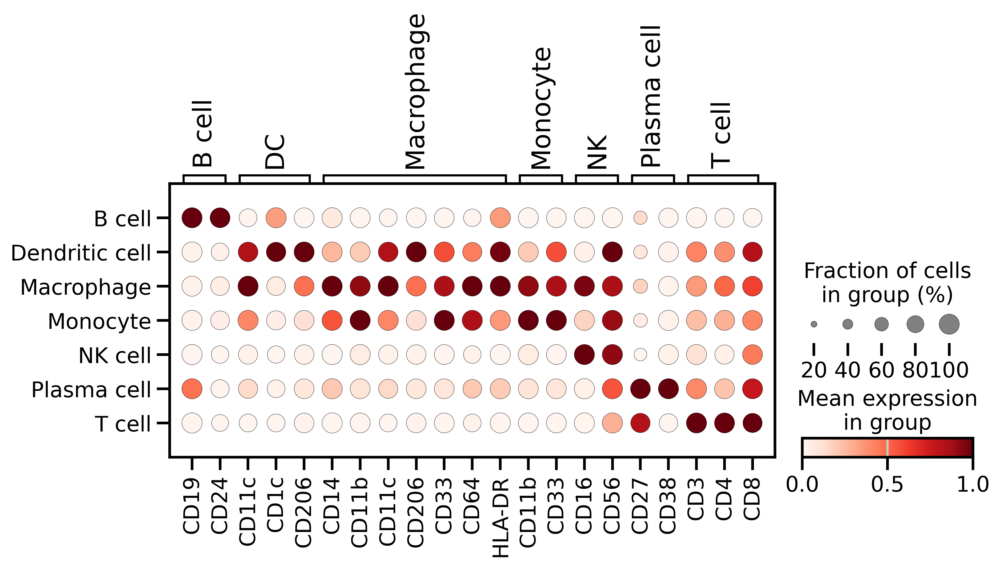

In [23]:
dp = sc.pl.dotplot(
    final_adata,
    groupby="cell_type_level1",
    var_names=surface_markers,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
    return_fig = True,
    figsize = (10,3.5)
    #save="surface_markers_fernandez_dendo.png"
)
dp.legend(width=2.2)
dp.show()
#dp.savefig("figures/dotplot_fernandezCITE-mse3-reload-level2-corrected2-nouncert.pdf")

## Wirka

In [44]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score
import matplotlib.colors as colors

In [221]:
adata = sc.read_h5ad("Altas_level1-noprototypes-allgenes-names-mse3-reload-corrected2-nouncert.h5ad") # new pipeline with pdcs and no uncertains

In [222]:
adata.obs["cell_type_level1"].value_counts()

cell_type_level1
T cell                102066
Macrophage             19225
NK cell                10613
Smooth Muscle Cell      9525
Monocyte                9084
B cell                  8691
EC                      6611
Fibroblast              5242
Dendritic cell          4139
Neutrophil              3016
Fibromyocyte            2617
Mast cell               1707
Plasma cell             1558
Name: count, dtype: int64

In [223]:
adata_wirka = adata[adata.obs["dataset"]=="Wirka"].copy()

In [224]:
adata_wirka.obs["cell_type"].value_counts()

cell_type
Fibroblast A    2239
EC              1830
Fibromyocyte     923
Inf MΦ           820
VSMC             802
CD4 T            704
Pericyte A       669
Pericyte B       543
B cell           526
Plasma cell      512
TREM2 MΦ         500
DC               345
Fibroblast B     242
NK               232
Neuron           214
Mono             206
CD8 T            206
Res MΦ           195
Mast              43
Name: count, dtype: int64

In [225]:
# new pipeline
wirka_mapping_dict_ehsan = {
    "T cell": ["CD4 T", "CD8 T"],
    "B cell": ["B cell"],
    "Fibroblast": ["Fibroblast A", "Fibroblast B"],
    "Fibromyocyte": ["Fibromyocyte"],
    "Monocyte" : ["Mono"],
    "EC": ["EC"],
    "Macrophage": ["TREM2 MΦ", "Inf MΦ", "Res MΦ"],
    "NK cell": ["NK"],
    "Smooth Muscle Cell": ["VSMC"],
    "Mast cell": ["Mast"],
    "Plasma cell": ["Plasma cell"],
    "Dendritic cell": ["DC"],
    "unknown": ["non-MΦ Myeloid", "Proliferating cells", "Pericyte A" , "Pericyte B", "Neuron"],
    "Neutrophil": ["Neutrophil"]
}

In [226]:
cell_types_wirka = list(adata_wirka.obs["cell_type"].values)

In [227]:
# Invert the wirka_mapping_dict
inverted_wirka_mapping = {v: k for k, values in wirka_mapping_dict_ehsan.items() for v in values}

# Map each cell type in cell_types_roche, keeping the original value if it's not in the mapping
mapped_cell_types_wirka = [inverted_wirka_mapping.get(cell_type, cell_type) for cell_type in cell_types_wirka]

In [228]:
cell_types_pred_wirka = list(adata_wirka.obs["cell_type_level1"].values)

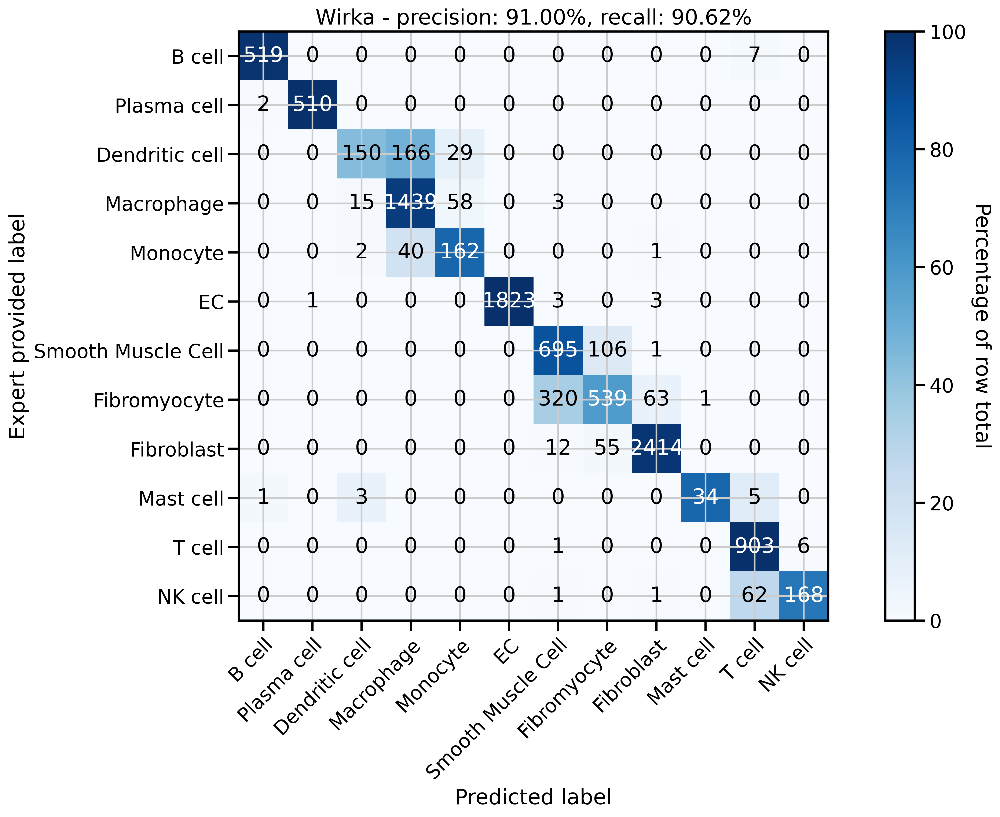

In [230]:
# Define the new order for the cell types
new_order = ["B cell", "Plasma cell", "Dendritic cell", "Macrophage", "Monocyte", "EC", "Smooth Muscle Cell", "Fibromyocyte", "Fibroblast", "Mast cell", "T cell", "NK cell"]

# Find the intersection of unique cell types in both lists and filter them according to the new order
common_cell_types_wirka = set(mapped_cell_types_wirka) & set(cell_types_pred_wirka)
common_cell_types_wirka = [ct for ct in new_order if ct in common_cell_types_wirka]

# Filter both lists to include only indices where the cell type of the true labels is in the common set
# and the corresponding predicted cell type is also in the common set.
common_indices = [i for i, ct in enumerate(mapped_cell_types_wirka) if ct in common_cell_types_wirka and cell_types_pred_wirka[i] in common_cell_types_wirka]

# Use the common indices to filter both lists
filtered_mapped_cell_types_wirka = [mapped_cell_types_wirka[i] for i in common_indices]
filtered_cell_types_pred_wirka = [cell_types_pred_wirka[i] for i in common_indices]

# Calculate the confusion matrix and accuracy using the new order
conf_matrix_wirka = confusion_matrix(filtered_mapped_cell_types_wirka, filtered_cell_types_pred_wirka, labels=common_cell_types_wirka)
accuracy_wirka = accuracy_score(filtered_mapped_cell_types_wirka, filtered_cell_types_pred_wirka)

# Calculate precision and recall for each class and overall
precision_wirka = precision_score(filtered_mapped_cell_types_wirka, filtered_cell_types_pred_wirka, labels=common_cell_types_wirka, average=None)
recall_wirka = recall_score(filtered_mapped_cell_types_wirka, filtered_cell_types_pred_wirka, labels=common_cell_types_wirka, average=None)
overall_precision_wirka = precision_score(filtered_mapped_cell_types_wirka, filtered_cell_types_pred_wirka, average='weighted')
overall_recall_wirka = recall_score(filtered_mapped_cell_types_wirka, filtered_cell_types_pred_wirka, average='weighted')

# Calculate percentages for coloring (per row)
row_sums = conf_matrix_wirka.sum(axis=1, keepdims=True)
conf_matrix_percentages = conf_matrix_wirka / row_sums * 100

# Plotting the confusion matrix
fig, ax = plt.subplots(figsize=(15, 10))
norm = colors.Normalize(vmin=0, vmax=100)  # Set vmax to 100 for percentage
im = ax.imshow(conf_matrix_percentages, interpolation='nearest', cmap=plt.cm.Blues, norm=norm)
cbar = ax.figure.colorbar(im, ax=ax)
cbar.ax.set_ylabel('Percentage of row total', rotation=-90, va="bottom")

ax.set(xticks=np.arange(len(common_cell_types_wirka)),
       yticks=np.arange(len(common_cell_types_wirka)),
       xticklabels=common_cell_types_wirka, yticklabels=common_cell_types_wirka,
       title=f'Wirka - precision: {overall_precision_wirka:.2%}, recall: {overall_recall_wirka:.2%}',
       ylabel='Expert provided label',
       xlabel='Predicted label')

plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

# Add text annotations (showing the original count)
for i in range(conf_matrix_wirka.shape[0]):
    for j in range(conf_matrix_wirka.shape[1]):
        ax.text(j, i, format(conf_matrix_wirka[i, j], 'd'),
                ha="center", va="center",
                color="white" if conf_matrix_percentages[i, j] > 50 else "black")

fig.tight_layout()
plt.savefig("figures/conf_matrix_common_wirka_mse3-reload-level2-new-labels-row-percentage-color-corrected2.pdf")
#plt.show()

## Emoto

In [231]:
adata = sc.read_h5ad("Altas_level1-noprototypes-allgenes-names-mse3-reload-corrected2-nouncert.h5ad") # new pipeline with pdcs and no uncertains

In [232]:
adata_emoto = adata[(adata.obs["dataset"] == "Emoto_ACS") | (adata.obs["dataset"] == "Emoto_SAP")].copy()

In [233]:
adata_emoto

AnnData object with n_obs × n_vars = 1621 × 28488
    obs: 'dataset', 'cell_type', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'sample', 'scDblFinder.sample', 'scDblFinder.class', 'scDblFinder.score', 'scDblFinder.weighted', 'scDblFinder.cxds_score', 'decontX_contamination', 'decontX_clusters', 'symptoms', 'n_genes', 'n_counts', 'size_factors', 'cell_type_level1'
    var: 'original_gene_names', 'ensembl_id'
    uns: 'log1p'
    layers: 'raw_decontXcounts', 'rounded_corrected_counts', 'uncorrected_counts'

In [234]:
adata_emoto.obs["cell_type_level1"].value_counts()

cell_type_level1
T cell                953
Monocyte              218
Macrophage            155
B cell                146
NK cell                88
Dendritic cell         36
Plasma cell            14
Neutrophil              6
Mast cell               3
Smooth Muscle Cell      2
Name: count, dtype: int64

In [235]:
adata_emoto.obs["cell_type"].value_counts()

cell_type
CD8 T           490
CD4 T           436
Mono            195
Naive B         104
TREM2 MΦ         94
NK               86
Inf MΦ           59
Memory B         46
unknown          39
DC               27
Res MΦ           23
Undetermined     16
Mast              6
Name: count, dtype: int64

In [236]:
# new pipeline
emoto_mapping_dict_ehsan = {
    "T cell": ["CD4 T", "CD8 T"],
    "B cell": ["Naive B", "Memory B"],
    "Monocyte" : ["Mono"],
    "Macrophage": ["TREM2 MΦ", "Inf MΦ", "Res MΦ"],
    "NK cell": ["NK"],
    "Mast cell": ["Mast"],
    "unknown": ["unknown", "Undetermined"],
    "Dendritic cell": ["DC"]
}

In [237]:
cell_types_emoto = list(adata_emoto.obs["cell_type"].values)

In [238]:
# Invert the emoto_mapping_dict
inverted_emoto_mapping = {v: k for k, values in emoto_mapping_dict_ehsan.items() for v in values}

# Map each cell type in cell_types_roche, keeping the original value if it's not in the mapping
mapped_cell_types_emoto = [inverted_emoto_mapping.get(cell_type, cell_type) for cell_type in cell_types_emoto]

In [239]:
cell_types_pred_emoto = list(adata_emoto.obs["cell_type_level1"].values)

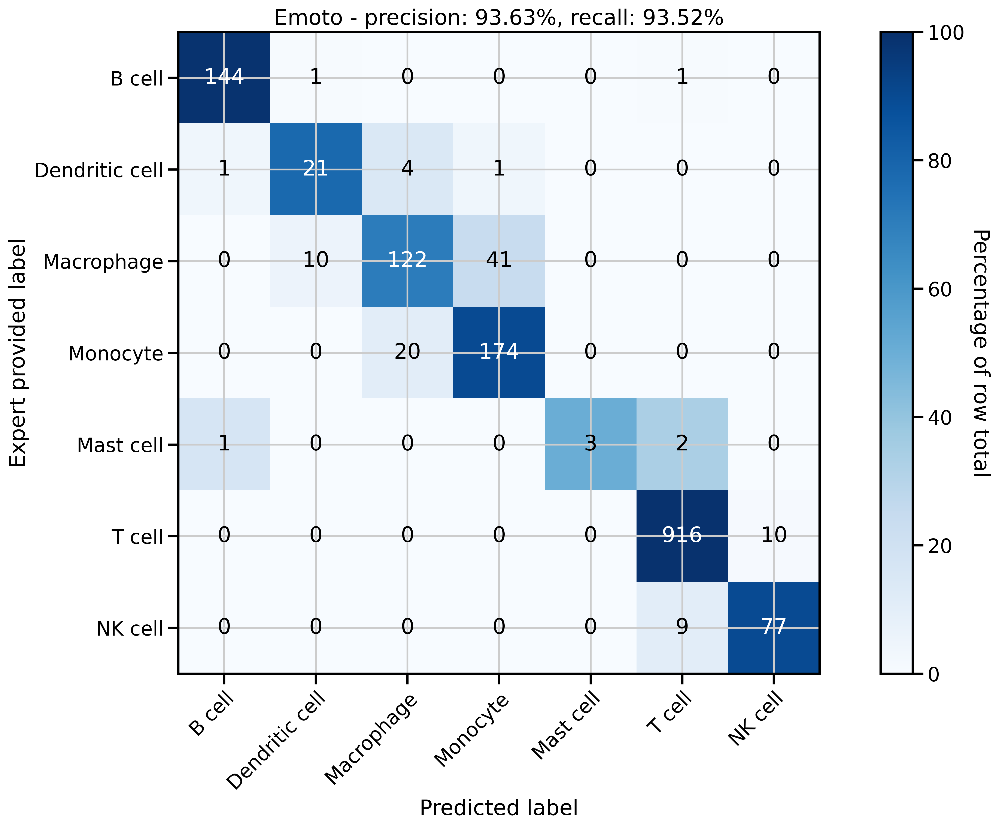

In [241]:
# Define the new order for the cell types
#new_order = ["B cell", "DC", "Macrophage", "Monocyte", "Mast cell", "T cell", "NK"]
new_order = ["B cell", "Dendritic cell", "Macrophage", "Monocyte", "Mast cell", "T cell", "NK cell"]

# Find the intersection of unique cell types in both lists and filter them according to the new order
common_cell_types_emoto = set(mapped_cell_types_emoto) & set(cell_types_pred_emoto)
common_cell_types_emoto = [ct for ct in new_order if ct in common_cell_types_emoto]

# Filter both lists to include only indices where the cell type of the true labels is in the common set
# and the corresponding predicted cell type is also in the common set.
common_indices = [i for i, ct in enumerate(mapped_cell_types_emoto) if ct in common_cell_types_emoto and cell_types_pred_emoto[i] in common_cell_types_emoto]

# Use the common indices to filter both lists
filtered_mapped_cell_types_emoto = [mapped_cell_types_emoto[i] for i in common_indices]
filtered_cell_types_pred_emoto = [cell_types_pred_emoto[i] for i in common_indices]

# Calculate the confusion matrix and accuracy using the new order
conf_matrix_emoto = confusion_matrix(filtered_mapped_cell_types_emoto, filtered_cell_types_pred_emoto, labels=common_cell_types_emoto)
accuracy_emoto = accuracy_score(filtered_mapped_cell_types_emoto, filtered_cell_types_pred_emoto)

# Calculate precision and recall for each class and overall
precision_emoto = precision_score(filtered_mapped_cell_types_emoto, filtered_cell_types_pred_emoto, labels=common_cell_types_emoto, average=None)
recall_emoto = recall_score(filtered_mapped_cell_types_emoto, filtered_cell_types_pred_emoto, labels=common_cell_types_emoto, average=None)
overall_precision_emoto = precision_score(filtered_mapped_cell_types_emoto, filtered_cell_types_pred_emoto, average='weighted')
overall_recall_emoto = recall_score(filtered_mapped_cell_types_emoto, filtered_cell_types_pred_emoto, average='weighted')

# Calculate percentages for coloring (per row)
row_sums = conf_matrix_emoto.sum(axis=1, keepdims=True)
conf_matrix_percentages = conf_matrix_emoto / row_sums * 100

# Plotting the confusion matrix
fig, ax = plt.subplots(figsize=(15, 10))
norm = colors.Normalize(vmin=0, vmax=100)  # Set vmax to 100 for percentage
im = ax.imshow(conf_matrix_percentages, interpolation='nearest', cmap=plt.cm.Blues, norm=norm)
cbar = ax.figure.colorbar(im, ax=ax)
cbar.ax.set_ylabel('Percentage of row total', rotation=-90, va="bottom")

ax.set(xticks=np.arange(len(common_cell_types_emoto)),
       yticks=np.arange(len(common_cell_types_emoto)),
       xticklabels=common_cell_types_emoto, yticklabels=common_cell_types_emoto,
       title=f'Emoto - precision: {overall_precision_emoto:.2%}, recall: {overall_recall_emoto:.2%}',
       ylabel='Expert provided label',
       xlabel='Predicted label')

plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

# Add text annotations (showing the original count)
for i in range(conf_matrix_emoto.shape[0]):
    for j in range(conf_matrix_emoto.shape[1]):
        ax.text(j, i, format(conf_matrix_emoto[i, j], 'd'),
                ha="center", va="center",
                color="white" if conf_matrix_percentages[i, j] > 50 else "black")

fig.tight_layout()
plt.savefig("figures/conf_matrix_common_emoto_mse3-reload-level2-new-label-row-percentage-color-corrected2.pdf")
#plt.show()

## Jaiswal

In [242]:
adata = sc.read_h5ad("Altas_level1-noprototypes-allgenes-names-mse3-reload-corrected2-nouncert.h5ad") # new pipeline with pdcs and no uncertains

In [243]:
adata_jaiswal = adata[(adata.obs["dataset"] == "Jaiswal")].copy()

In [244]:
adata_jaiswal.obs["cell_type"].value_counts()

cell_type
CD4+ T-cells                1871
CD8+ T-cells                1754
Foam cells                   498
Inflammatory macrophages     340
Active NK cells              312
Resting NK cells             185
B-cells                      136
cDCs                         124
Plasmacytoid DCs              99
MHC-hi macrophages            74
CD16+ monocytes               46
LYVE1+ TR macrophages         45
Basophils                     38
Plasma cells                  34
Name: count, dtype: int64

In [245]:
adata_jaiswal.obs["cell_type_level1"].value_counts()

cell_type_level1
T cell            3231
NK cell            895
Macrophage         692
Monocyte           287
Dendritic cell     231
B cell             142
Mast cell           40
Plasma cell         35
Neutrophil           3
Name: count, dtype: int64

In [246]:
Jaiswal_mapping_dict = {
    "T cell": ["CD4+ T-cells", "CD8+ T-cells"],
    "Macrophage": ["Foam cells", "Inflammatory macrophages", "MHC-hi macrophages", "LYVE1+ TR macrophages"],
    "NK cell": ["Active NK cells", "Resting NK cells"],
    "B cell": ["B-cells"],
    "Dendritic cell": ["cDCs", "Plasmacytoid DCs"],
    "Monocyte": ["CD16+ monocytes"],
    "unknown": ["Basophils"],
    "Plasma cell": ["Plasma cells"]
}

In [247]:
cell_types_jaiswal = list(adata_jaiswal.obs["cell_type"].values)

In [248]:
# Invert the Jaiswal_mapping_dict
inverted_Jaiswal_mapping = {v: k for k, values in Jaiswal_mapping_dict.items() for v in values}

# Map each cell type in cell_types_jaiswal, keeping the original value if it's not in the mapping
mapped_cell_types_jaiswal = [inverted_Jaiswal_mapping.get(cell_type, cell_type) for cell_type in cell_types_jaiswal]

In [249]:
cell_types_pred_jaiswal = list(adata_jaiswal.obs["cell_type_level1"].values)

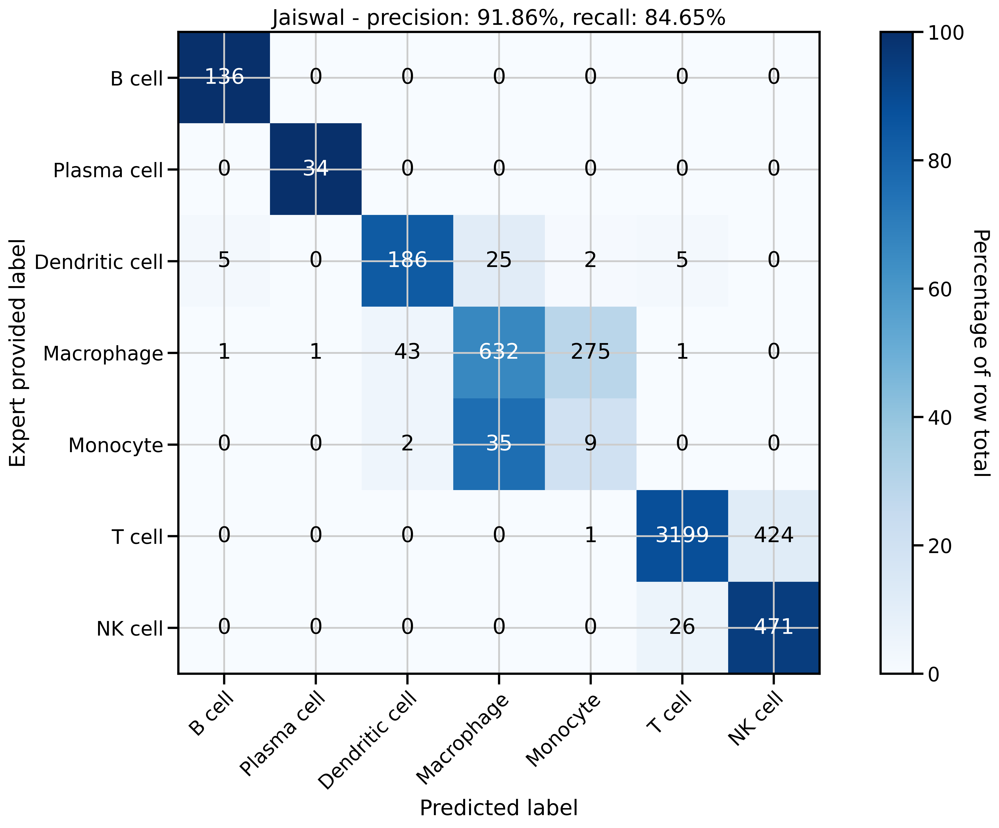

In [251]:
# Define the new order for the cell types
new_order = ["B cell", "Plasma cell", "Dendritic cell", "Macrophage", "Monocyte", "T cell", "NK cell"]

# Find the intersection of unique cell types in both lists and filter them according to the new order
common_cell_types_jaiswal = set(mapped_cell_types_jaiswal) & set(cell_types_pred_jaiswal)
common_cell_types_jaiswal = [ct for ct in new_order if ct in common_cell_types_jaiswal]

# Filter both lists to include only indices where the cell type of the true labels is in the common set
# and the corresponding predicted cell type is also in the common set.
common_indices = [i for i, ct in enumerate(mapped_cell_types_jaiswal) if ct in common_cell_types_jaiswal and cell_types_pred_jaiswal[i] in common_cell_types_jaiswal]

# Use the common indices to filter both lists
filtered_mapped_cell_types_jaiswal = [mapped_cell_types_jaiswal[i] for i in common_indices]
filtered_cell_types_pred_jaiswal = [cell_types_pred_jaiswal[i] for i in common_indices]

# Calculate the confusion matrix and accuracy using the new order
conf_matrix_jaiswal = confusion_matrix(filtered_mapped_cell_types_jaiswal, filtered_cell_types_pred_jaiswal, labels=common_cell_types_jaiswal)
accuracy_jaiswal = accuracy_score(filtered_mapped_cell_types_jaiswal, filtered_cell_types_pred_jaiswal)

# Calculate precision and recall for each class and overall
precision_jaiswal = precision_score(filtered_mapped_cell_types_jaiswal, filtered_cell_types_pred_jaiswal, labels=common_cell_types_jaiswal, average=None)
recall_jaiswal = recall_score(filtered_mapped_cell_types_jaiswal, filtered_cell_types_pred_jaiswal, labels=common_cell_types_jaiswal, average=None)
overall_precision_jaiswal = precision_score(filtered_mapped_cell_types_jaiswal, filtered_cell_types_pred_jaiswal, average='weighted')
overall_recall_jaiswal = recall_score(filtered_mapped_cell_types_jaiswal, filtered_cell_types_pred_jaiswal, average='weighted')

# Calculate percentages for coloring (per row)
row_sums = conf_matrix_jaiswal.sum(axis=1, keepdims=True)
conf_matrix_percentages = conf_matrix_jaiswal / row_sums * 100

# Plotting the confusion matrix
fig, ax = plt.subplots(figsize=(15, 10))
norm = colors.Normalize(vmin=0, vmax=100)  # Set vmax to 100 for percentage
im = ax.imshow(conf_matrix_percentages, interpolation='nearest', cmap=plt.cm.Blues, norm=norm)
cbar = ax.figure.colorbar(im, ax=ax)
cbar.ax.set_ylabel('Percentage of row total', rotation=-90, va="bottom")

ax.set(xticks=np.arange(len(common_cell_types_jaiswal)),
       yticks=np.arange(len(common_cell_types_jaiswal)),
       xticklabels=common_cell_types_jaiswal, yticklabels=common_cell_types_jaiswal,
       title=f'Jaiswal - precision: {overall_precision_jaiswal:.2%}, recall: {overall_recall_jaiswal:.2%}',
       ylabel='Expert provided label',
       xlabel='Predicted label')

plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

# Add text annotations (showing the original count)
for i in range(conf_matrix_jaiswal.shape[0]):
    for j in range(conf_matrix_jaiswal.shape[1]):
        ax.text(j, i, format(conf_matrix_jaiswal[i, j], 'd'),
                ha="center", va="center",
                color="white" if conf_matrix_percentages[i, j] > 50 else "black")

fig.tight_layout()
plt.savefig("figures/conf_matrix_common_jaiswal_mse3-reload-level2-new-label-row-percentage-color-corrected2.pdf")
#plt.show()

## Pauli

In [252]:
adata = sc.read_h5ad("Altas_level1-noprototypes-allgenes-names-mse3-reload-corrected2-nouncert.h5ad") # new pipeline with pdcs and no uncertains

In [253]:
adata_roche = adata[(adata.obs["dataset"] == "Roche")].copy()

In [254]:
adata_roche.obs["cell_type"].value_counts()

cell_type
Fibromyocyte           164
EC A                   147
CD4 T                  146
CD8 T                  145
non-MΦ Myeloid         107
NK                      77
VSMC B                  72
VSMC A                  72
TREM2 MΦ                71
Inf MΦ                  62
EC B                    59
Res MΦ                  38
Fibroblast              30
Proliferating cells     25
Plasma cell             24
Mast cell               18
B cell                  12
Name: count, dtype: int64

In [255]:
# new pipeline
Roche_mapping_dict = {
    "T cell": ["CD4 T", "CD8 T"],
    "B cell": ["B cell"],
    "Fibroblast": ["Fibroblast"],
    "Fibromyocyte": ["Fibromyocyte"],
    "EC": ["EC A", "EC B"],
    "Macrophage": ["TREM2 MΦ", "Inf MΦ", "Res MΦ"],
    "NK cell": ["NK"],
    "Smooth Muscle Cell": ["VSMC A", "VSMC B"],
    "Mast cell": ["Mast cell"],
    "Plasma cell": ["Plasma cell"],
    "unknown": ["non-MΦ Myeloid", "Proliferating cells" ]
}

In [256]:
cell_types_roche = list(adata_roche.obs["cell_type"].values)

In [257]:
# Invert the Roche_mapping_dict
inverted_Roche_mapping = {v: k for k, values in Roche_mapping_dict.items() for v in values}

# Map each cell type in cell_types_roche, keeping the original value if it's not in the mapping
mapped_cell_types_roche = [inverted_Roche_mapping.get(cell_type, cell_type) for cell_type in cell_types_roche]

In [258]:
cell_types_pred_roche = list(adata_roche.obs["cell_type_level1"].values)

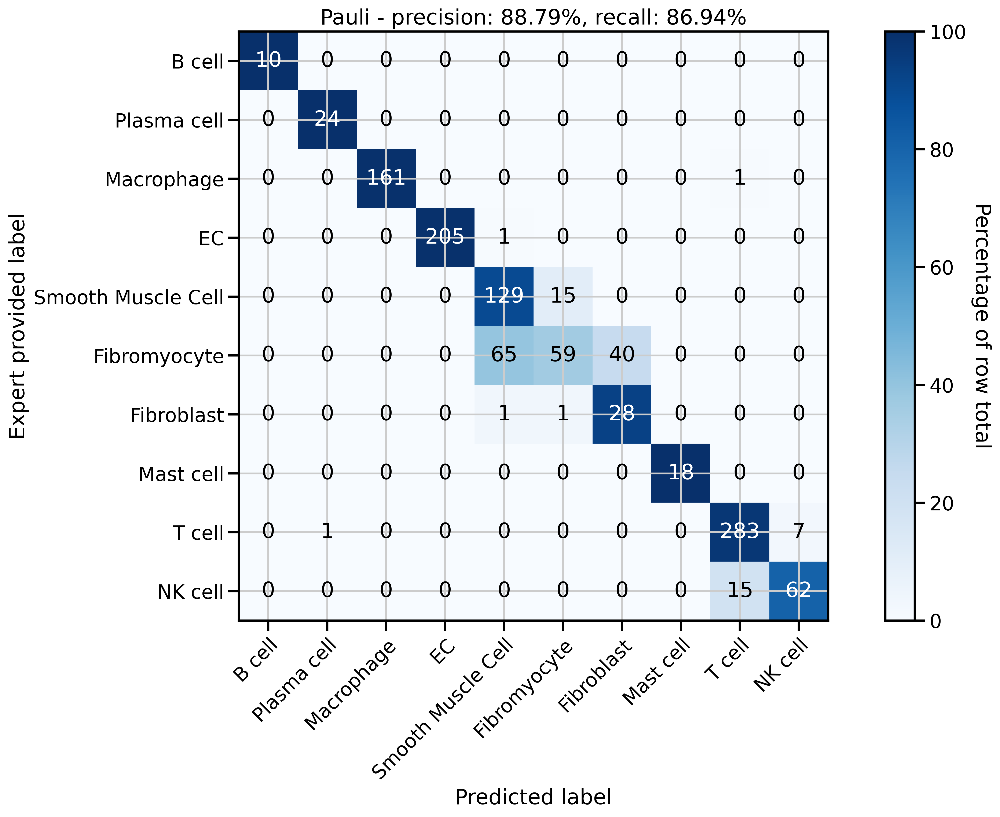

In [260]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score

# Define the new order for the cell types
new_order = ["B cell", "Plasma cell", "Macrophage", "EC", "Smooth Muscle Cell", "Fibromyocyte", "Fibroblast", "Mast cell", "T cell", "NK cell"]

# Find the intersection of unique cell types in both lists and filter them according to the new order
common_cell_types_roche = set(mapped_cell_types_roche) & set(cell_types_pred_roche)
common_cell_types_roche = [ct for ct in new_order if ct in common_cell_types_roche]

# Filter both lists to include only indices where the cell type of the true labels is in the common set
# and the corresponding predicted cell type is also in the common set.
common_indices = [i for i, ct in enumerate(mapped_cell_types_roche) if ct in common_cell_types_roche and cell_types_pred_roche[i] in common_cell_types_roche]

# Use the common indices to filter both lists
filtered_mapped_cell_types_roche = [mapped_cell_types_roche[i] for i in common_indices]
filtered_cell_types_pred_roche = [cell_types_pred_roche[i] for i in common_indices]

# Calculate the confusion matrix and accuracy using the new order
conf_matrix_roche = confusion_matrix(filtered_mapped_cell_types_roche, filtered_cell_types_pred_roche, labels=common_cell_types_roche)
accuracy_roche = accuracy_score(filtered_mapped_cell_types_roche, filtered_cell_types_pred_roche)

# Calculate precision and recall for each class and overall
precision_roche = precision_score(filtered_mapped_cell_types_roche, filtered_cell_types_pred_roche, labels=common_cell_types_roche, average=None)
recall_roche = recall_score(filtered_mapped_cell_types_roche, filtered_cell_types_pred_roche, labels=common_cell_types_roche, average=None)
overall_precision_roche = precision_score(filtered_mapped_cell_types_roche, filtered_cell_types_pred_roche, average='weighted')
overall_recall_roche = recall_score(filtered_mapped_cell_types_roche, filtered_cell_types_pred_roche, average='weighted')

# Calculate percentages for coloring (per row)
row_sums = conf_matrix_roche.sum(axis=1, keepdims=True)
conf_matrix_percentages = conf_matrix_roche / row_sums * 100

# Plotting the confusion matrix
fig, ax = plt.subplots(figsize=(15, 10))
norm = colors.Normalize(vmin=0, vmax=100)  # Set vmax to 100 for percentage
im = ax.imshow(conf_matrix_percentages, interpolation='nearest', cmap=plt.cm.Blues, norm=norm)
cbar = ax.figure.colorbar(im, ax=ax)
cbar.ax.set_ylabel('Percentage of row total', rotation=-90, va="bottom")

ax.set(xticks=np.arange(len(common_cell_types_roche)),
       yticks=np.arange(len(common_cell_types_roche)),
       xticklabels=common_cell_types_roche, yticklabels=common_cell_types_roche,
       title=f'Pauli - precision: {overall_precision_roche:.2%}, recall: {overall_recall_roche:.2%}',
       ylabel='Expert provided label',
       xlabel='Predicted label')

plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

# Add text annotations (showing the original count)
for i in range(conf_matrix_roche.shape[0]):
    for j in range(conf_matrix_roche.shape[1]):
        ax.text(j, i, format(conf_matrix_roche[i, j], 'd'),
                ha="center", va="center",
                color="white" if conf_matrix_percentages[i, j] > 50 else "black")

fig.tight_layout()
plt.savefig("figures/conf_matrix_common_roche_mse3-reload-level2-new-labels-row-percentage-color-corrected2.pdf")
#plt.show()

# Transfer label to all genes (execute before validation)

In [209]:
adata_post_int = sc.read_h5ad("Altas_level1-noprototypes-mse-3-reload-corrected2-nouncert.h5ad") # new pipeline with pdcs and no uncertain

In [210]:
adata_post_int.obs_names = adata_post_int.obs_names.str[:-2]

In [211]:
adata_pre_pp = sc.read_h5ad("big-datasets-concat-ensembl-nodub-newfern_with6-aggr-all-sparse-scranlog1p-annot-nodoublets.h5ad")

In [212]:
# Assuming 'obs_names' is the column that represents your observations. Should be just the post int obs
common_obs = adata_pre_pp.obs_names[adata_pre_pp.obs_names.isin(adata_post_int.obs_names)]

In [214]:
# Create a subset of adata_pre_pp for easier handling
adata_pre_pp_subset = adata_pre_pp[common_obs]

In [215]:
adata_post_int.obs

,dataset,cell_type,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,sample,scDblFinder.sample,scDblFinder.class,scDblFinder.score,...,n_counts,size_factors,cell_type_level1,cell_type_level1_corrected,atlas_key,conditions_combined,cell_type_pred,cell_type_uncert,query,cell_type_level1_all
car02_d_AAATGGATCGAGTGGA.1,Roche,CD8 T,647.0,1273.0,78.0,6.127258,2_Roche,2,singlet,0.507475,...,NaN,0.306150,NK,T cell,ref,2_Roche,Reference,NaN,0,T cell
car02_d_AAGGAATGTCGTTGGC.1,Roche,Inf MΦ,2881.0,9727.0,1564.0,16.078955,2_Roche,2,singlet,0.563011,...,NaN,2.219434,Macrophage,Macrophage,ref,2_Roche,Reference,NaN,0,Macrophage
car02_d_AATGGCTTCTTCCAGC.1,Roche,TREM2 MΦ,4906.0,43494.0,3031.0,6.968777,2_Roche,2,doublet,0.675130,...,NaN,9.472461,Macrophage,Macrophage,ref,2_Roche,Reference,NaN,0,Macrophage
car02_d_ACCTACCGTTTACTGG.1,Roche,Plasma cell,335.0,8015.0,3.0,0.037430,2_Roche,2,singlet,0.501177,...,NaN,0.099273,Plasma cell,Plasma cell,ref,2_Roche,Reference,NaN,0,Plasma cell
car02_d_ACCTGAAGTCATCCCT.1,Roche,Mast cell,1113.0,2843.0,219.0,7.703130,2_Roche,2,singlet,0.520772,...,NaN,0.092680,Mast cell,Mast cell,ref,2_Roche,Reference,NaN,0,Mast cell
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Fresh_DTAN_4047_TTGAACGCAATGGACG-1,Jaiswal,Foam cells,564.0,1832.0,26.0,1.419214,2_Jaiswal,2,singlet,0.001764,...,1832.0,0.267544,Macrophage,unknown,query,2_Jaiswal,Macrophage,0.465370,1,Macrophage
Fresh_DTAN_4047_TTGAACGCATCTCGCT-1,Jaiswal,Foam cells,211.0,1081.0,2.0,0.185014,2_Jaiswal,2,singlet,0.004880,...,1081.0,0.071870,Macrophage,unknown,query,2_Jaiswal,Macrophage,0.146040,1,Macrophage
Fresh_DTAN_4047_TTGGAACCACCGTTGG-1,Jaiswal,Foam cells,734.0,1989.0,132.0,6.636501,2_Jaiswal,2,singlet,0.002188,...,1989.0,0.368537,Macrophage,unknown,query,2_Jaiswal,Macrophage,0.177523,1,Macrophage
Fresh_DTAN_4047_TTGTAGGGTAGGCTGA-1,Jaiswal,Foam cells,1121.0,3510.0,2.0,0.056980,2_Jaiswal,2,singlet,0.005225,...,3510.0,0.724582,Macrophage,unknown,query,2_Jaiswal,Macrophage,0.286143,1,Macrophage


In [216]:
# Transfer "cell_type_level1_all" data
adata_pre_pp_subset.obs["cell_type_level1"] = adata_post_int.obs["cell_type_level1_all"].reindex(common_obs) # new pipeline

/tmp/ipykernel_1424236/1233548290.py:5: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_pre_pp_subset.obs["cell_type_level1"] = adata_post_int.obs["cell_type_level1_all"].reindex(common_obs) # new pipeline


In [217]:
adata_pre_pp_subset.obs["cell_type_level1"].value_counts()

cell_type_level1
T cell                102066
Macrophage             19225
NK cell                10613
Smooth Muscle Cell      9525
Monocyte                9084
B cell                  8691
EC                      6611
Fibroblast              5242
Dendritic cell          4139
Neutrophil              3016
Fibromyocyte            2617
Mast cell               1707
Plasma cell             1558
Name: count, dtype: int64

In [218]:
adata_pre_pp_subset.var['ensembl_id'] = adata_pre_pp_subset.var.index
adata_pre_pp_subset.var.index = adata_pre_pp_subset.var['original_gene_names']

In [219]:
adata_pre_pp_subset.write_h5ad("Altas_level1-noprototypes-allgenes-names-mse3-reload-corrected2-nouncert.h5ad") # NOTE: without nouncert is input of this file.Altas_level1-noprototypes-allgenes-names-mse3-reload-corrected2 was never overwritten 

In [220]:
adata_pre_pp_subset

AnnData object with n_obs × n_vars = 184094 × 28488
    obs: 'dataset', 'cell_type', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'sample', 'scDblFinder.sample', 'scDblFinder.class', 'scDblFinder.score', 'scDblFinder.weighted', 'scDblFinder.cxds_score', 'decontX_contamination', 'decontX_clusters', 'symptoms', 'n_genes', 'n_counts', 'size_factors', 'cell_type_level1'
    var: 'original_gene_names', 'ensembl_id'
    uns: 'log1p'
    layers: 'raw_decontXcounts', 'rounded_corrected_counts', 'uncorrected_counts'

## all cells level 1 dotplot (infered from level2)

In [11]:
level1_marker = {
    'Bcell': ['CD79A', 'CD79B', 'MS4A1', 'IGKC', 'CD22', 'FCER2'],
    'DC': ['CLEC10A', 'FCER1A', 'CD1C', 'HLA-DRA', 'HLA-DRB1'],
    'EC': ['PECAM1', 'VWF', 'FABP4', 'CLDN5', 'IFI27', 'ECSCR', 'DYSF', 'CD34', 'COL4A1', 'COL4A2', 'SPARCL1', 'PLVAP', 'MPZL2', 'SULF1', 'EDN1'],
    'Fibroblast': ['LUM', 'DCN', 'COL1A1', 'COL1A2', 'FBLN1', 'THY1', "C3", "C7"],
    'Fibromyocyte': ['FN1', 'LUM', 'TNFRSF11B', 'ACTA2', "TCF21"],
    'Macrophage': ['C1QA', 'C1QB', 'C1QC', 'CD74', 'CXCL8', 'AIF1', 'CD14', 'CD68', 'ITGAM', 'CSF1R', 'HLA-DRA', 'LGALS3'],
    'Mast cell': ['TPSAB1', 'TPSB2', 'KIT', 'HDC', 'CMA1'],
    'Monocyte': ['FCN1', 'S100A8', 'S100A9', 'S100A12', 'VCAN', 'CD52', 'LYZ', 'CTSS'],
    'NK': ['NKG7', 'XCL1', 'CTSW', 'XCL2', 'CD160', 'FCGR3A', 'PRF1', 'GNLY'],
    "Neutrophil": ["NAMPT", "IFITM2", "G0S2", "CXCL8", "NEAT1", "SRGN", "AQP9", "SOD2", "FCGR3B", "IVNS1ABP"],
    'Plasma cell': ['IGKC', 'IGHM', 'IGHA1', 'IGLC2', 'IGLC3', 'JCHAIN'],  
    'SMC': ['ACTA2', 'MYH11', 'MYL9', 'TPM2', 'CALD1', 'TAGLN', 'TNFRSF11B', 'LUM', 'APOE', 'APOC1', 'AGT', 'NOTCH3', 'PDGFRB', 'MFAP4'],
    'Tcell': ['CD2', 'TRAC', 'CD69', 'CD3D', 'CD3E', 'CD4', 'CD8A', 'CD8B', 'EOMES', 'LAG3']
}

In [3]:
adata = sc.read_h5ad("Altas_level1-noprototypes-allgenes-names-mse3-reload-corrected2-nouncert.h5ad")

In [4]:
adata

AnnData object with n_obs × n_vars = 184094 × 28488
    obs: 'dataset', 'cell_type', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'sample', 'scDblFinder.sample', 'scDblFinder.class', 'scDblFinder.score', 'scDblFinder.weighted', 'scDblFinder.cxds_score', 'decontX_contamination', 'decontX_clusters', 'symptoms', 'n_genes', 'n_counts', 'size_factors', 'cell_type_level1'
    var: 'original_gene_names', 'ensembl_id'
    uns: 'log1p'
    layers: 'raw_decontXcounts', 'rounded_corrected_counts', 'uncorrected_counts'

In [12]:
#check if the marker genes are in the data and print percentage of marker genes per celltype in the data
#also print which marker genes are not in the data
#create new dict on the way
marker_genes_in_data = {}
for celltype in level1_marker:
    marker_genes_in_data[celltype] = list(set(level1_marker[celltype]).intersection(adata.var_names))
    print(celltype, len(set(level1_marker[celltype]).intersection(adata.var_names))/len(level1_marker[celltype]))
    print("not included: ", set(level1_marker[celltype]).difference(adata.var_names))

Bcell 1.0
not included:  set()
DC 1.0
not included:  set()
EC 0.9333333333333333
not included:  {'ECSCR'}
Fibroblast 1.0
not included:  set()
Fibromyocyte 1.0
not included:  set()
Macrophage 1.0
not included:  set()
Mast cell 1.0
not included:  set()
Monocyte 1.0
not included:  set()
NK 1.0
not included:  set()
Neutrophil 1.0
not included:  set()
Plasma cell 1.0
not included:  set()
SMC 1.0
not included:  set()
Tcell 1.0
not included:  set()


/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No dat

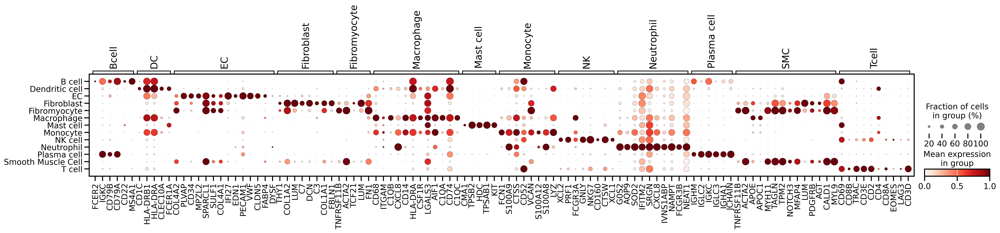

In [14]:
dp = sc.pl.dotplot(
    adata,
    groupby="cell_type_level1",
    var_names=marker_genes_in_data,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
    swap_axes = False,
    figsize = (30,3.5),
    return_fig = True
)

dp.legend(width=2.2)
#dp.show()
dp.savefig("figures/dotplot_surface_markers_prebashore_figure2-corrected2.pdf")

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No dat

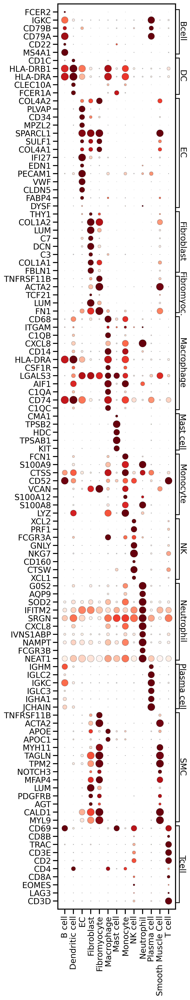

In [16]:
dp = sc.pl.dotplot(
    adata,
    groupby="cell_type_level1",
    var_names=marker_genes_in_data,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
    return_fig = True,
    figsize = (4.5,30),
    swap_axes = True
    #save="surface_markers_fernandez_dendo.png"
)
dp.legend(width=0)
#dp.show()
dp.savefig("figures/dotplot_surface_markers_prebashore_figure2-corrected2-swap.pdf", format='pdf')